## **Project 6** Consumer goods classification





<!--                         ## Plan
Notebook : project_6_image_processing
I) Image preprocessing

    1) Apllying ML algorithms on initial images
    2) Apllying ML algorithms on cleaned images with classical pretreatement techniques
    3) Apllying ML algorithms on images after dimentionality reduction
    4) Apllying ML algorithms on images after feature extraction with SIFT and HOG -->
    
# Text processing - Automatic text categorization

   ## I) Analyzing Data -EDA
   
        1) Visualizing the categories of consumer goods and their distribution 
        2) Visualizing the sub-categories 
        3) Number of unique subcategories with respect to their level
        
   ## II) Text cleaning
   
        1) Remove tags, special characters and digits, stopwords, lemmatize 
        2) WordCloud Visualization of the most frequently repeated words in the entire text of descriptions
        3) Adding 'category_encode' column to the data 
        4) Train and Test splitting
        
   ## III) Text feature extraction
   
   
        1) Bag of Words
        2) TF-IDF
        3) Word2Vec
        4) Bert
        5) USE (Universal Sentence Encoder)
       
   ##  IV) Dimentionality reduction and KMeans clustering    

   ##  V) Calcul de similarité entre les catégories réelles et les clusters
   
       1) Graphiques avec résultats de différents modèles
     
       
   ##  VI) LDA Topic Modeling 

        1) Phrase Modeling: Bi-grams and Tri-grams
                Given a sequence of N-1 words, an N-gram model predicts the most probable word that might                 follow this sequence
        
        2) Data Transformation: Corpus and Dictionary
                calculating Term Document Frequency
        3) Creating a Base Model and calculating it's Coherence score
        4) Hyper-parameter Tuning
        5) Final model
        6) Visualize the results of  topics-keywords with pyLDAvis
     
  

In [1]:

import pandas as pd
import numpy as np
import os
import random

# Visualizations
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
%matplotlib inline

import pyLDAvis.gensim_models


# Language Processing
import nltk
import re
from nltk.stem import PorterStemmer # to reduce words to their root
from nltk.corpus import stopwords # to get rid of unnecessary words
from nltk.stem import WordNetLemmatizer # Lemmatize words kepping only root
from nltk.stem.wordnet import WordNetLemmatizer
from keras.preprocessing.text import Tokenizer

# Sklearn
from sklearn.pipeline import FeatureUnion, Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans,  MiniBatchKMeans
from sklearn import manifold
from sklearn.manifold import Isomap
from sklearn import preprocessing
from sklearn.feature_selection import chi2,  SelectKBest
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
# Measure models performance
from sklearn.metrics import accuracy_score, silhouette_samples, silhouette_score, davies_bouldin_score, adjusted_rand_score
# Dimentionality reduction
from sklearn.decomposition import PCA, LatentDirichletAllocation


#Gensim for word embedding
import gensim
import gensim.corpora as corpora
import gensim.downloader as gensim_api
from gensim.utils import simple_preprocess
from gensim.models import Word2Vec, CoherenceModel

# For Word2Vec model
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

## Imports for BERT 
# import tensorflow as tf
# # import tensorflow_hub as hub
# import tensorflow.keras
# from tensorflow.keras import backend as K

# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# from tensorflow.keras import metrics as kmetrics
# from tensorflow.keras.layers import *
# from tensorflow.keras.models import Model
from sklearn.decomposition import PCA
## Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

# Save model
import pickle

# Don't show warning messages
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

C:\Users\adele\anaconda3\lib\site-packages\scipy\sparse\sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


#  I) Analyzing Data -EDA

In [4]:
text = pd.read_csv('text.csv') # is the initiale dataframe with all columns

In [2]:
data = pd.read_csv('data.csv') # is the data of only useful columns after selection

In [3]:
data_category_levels = pd.read_csv('data_category_levels.csv') # is the dataframe of categories and subcotegories

Take a look at the data 

In [5]:
text.head(1)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."


In [5]:
text[['description', 'image', 'product_category_tree']]

,description,image,product_category_tree
0,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Curtains & Accessories >>..."
1,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T..."
2,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>..."
4,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>..."
...,...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,958f54f4c46b53c8a0a9b8167d9140bc.jpg,"[""Baby Care >> Baby & Kids Gifts >> Stickers >..."
1046,Wallmantra Large Vinyl Sticker Sticker (Pack o...,fd6cbcc22efb6b761bd564c28928483c.jpg,"[""Baby Care >> Baby & Kids Gifts >> Stickers >..."
1047,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,5912e037d12774bb73a2048f35a00009.jpg,"[""Baby Care >> Baby & Kids Gifts >> Stickers >..."
1048,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,"[""Baby Care >> Baby & Kids Gifts >> Stickers >..."


In [6]:
# display maximum cell content
pd.options.display.max_colwidth = 10000
pd.options.display.max_rows=10000

For text preprocesing we only need text data.

Let's shrink the data to keep only wanted colums.

In [7]:
# Removing unwanted columns from data
data = text.drop(columns=[
    'crawl_timestamp',
    'product_url',
    'pid',
    'retail_price',
    'discounted_price',
    'is_FK_Advantage_product',
    'product_rating',
    'overall_rating',
    'product_specifications',
    'brand'
    
])


In [8]:
data.columns

Index(['uniq_id', 'product_name', 'product_category_tree', 'image',
       'description'],
      dtype='object')

In [9]:
def global_filling_rate(dataframe):
    """Compute and displays global filling rate of a DataFrame"""

    # get the numbers of rows and columns in the dataframe
    nb_rows, nb_columns = dataframe.shape
    print("DataFrame has {} rows and {} columns.".format(nb_rows, nb_columns))

    # get the number of non-Nan data in the dataframe
    nb_data = dataframe.count().sum()

    # computing the filling rate
    filling_rate = nb_data / (nb_rows * nb_columns)
    missing_rate = 1 - filling_rate

    # computing the total missing values
    missing_values = (nb_rows * nb_columns) - nb_data

    # display global results
    print("")
    print("Global filling rate of the DataFrame: {:.2%}".format(filling_rate))
    print("Missing values in the DataFrame: {} ({:.2%})"
          .format(missing_values, missing_rate))

    # compute number of rows with missing values
    mask = dataframe.isnull().any(axis=1)
    rows_w_missing_values = len(dataframe[mask])
    rows_w_missing_values_percentage = rows_w_missing_values / nb_rows

    # display results
    print("")
    print("Number of rows with missing values: {} ({:.2%})"
          .format(rows_w_missing_values, rows_w_missing_values_percentage))

    # compute number of columns with missing values
    mask = dataframe.isnull().any(axis=0)
    cols_w_missing_values = len(dataframe[dataframe.columns[mask]].columns)
    cols_w_missing_values_percentage = cols_w_missing_values / nb_columns

    # display results
    print("Number of columns with missing values: {} ({:.2%})"
          .format(cols_w_missing_values, cols_w_missing_values_percentage))

In [10]:
global_filling_rate(text)

DataFrame has 1050 rows and 15 columns.

Global filling rate of the DataFrame: 97.83%
Missing values in the DataFrame: 341 (2.17%)

Number of rows with missing values: 340 (32.38%)
Number of columns with missing values: 4 (26.67%)


### We have the column 'product_category_tree' which contains the branches of the categories of different type of goods that are described in the 'description' column.
### We want to see how many categories there are, let's decompose the product category tree.

In [11]:
# First row of the column of  product categories 
data.product_category_tree[0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [12]:
# We have in every category, sub categories nad we want to see how many of these subcategories we've got
# Determining the maximum tree depth of categories

cat_depth = data['product_category_tree'].apply(lambda x: x.count('>>')) # counting how many sub-categories are there 
max_depth = cat_depth.max() # maximum numbr of sub-categories


# Creating 6 columns out of  'product_category_tree' column 

def string_cleaning(indx, my_string, level_cols):
    my_string = my_string.replace("[\"", "").replace("\"]", "") #Removing the square brackets from the 
    tab_string = my_string.split(">>") # Spliting on  '>>' separating the categories
    size_tab_str = len(tab_string) 
    tup_str = tuple([tab_string[i].strip() if i<size_tab_str else "" # removing the white spaces before and after each category
                     for i in np.arange(max_depth)])

                    
    return tup_str

level_cols = ['cat_level_'+str(i) for i in np.arange(max_depth)]
ser_tuple = data['product_category_tree']\
    .apply(lambda s: string_cleaning(s.index, s, level_cols))
data_category_levels = pd.DataFrame([[a,'/'.join([a,b]),'/'.join([a,b,c]),
                              '/'.join([a,b,c,d]),'/'.join([a,b,c,d,e]),
                              '/'.join([a,b,c,d,e,f])] \
                             for a,b,c,d,e,f in ser_tuple.values],
                            columns=level_cols, index=data.index)

In [13]:
data_category_levels.head(1)

,cat_level_0,cat_level_1,cat_level_2,cat_level_3,cat_level_4,cat_level_5
0,Home Furnishing,Home Furnishing/Curtains & Accessories,Home Furnishing/Curtains & Accessories/Curtains,Home Furnishing/Curtains & Accessories/Curtains/Elegance Polyester Multicolor Abstract Eyelet Do...,Home Furnishing/Curtains & Accessories/Curtains/Elegance Polyester Multicolor Abstract Eyelet Do.../,Home Furnishing/Curtains & Accessories/Curtains/Elegance Polyester Multicolor Abstract Eyelet Do...//


In [23]:
# Save new category  dataframe into a csv file
data_category_levels.to_csv("data_category_levels.csv")


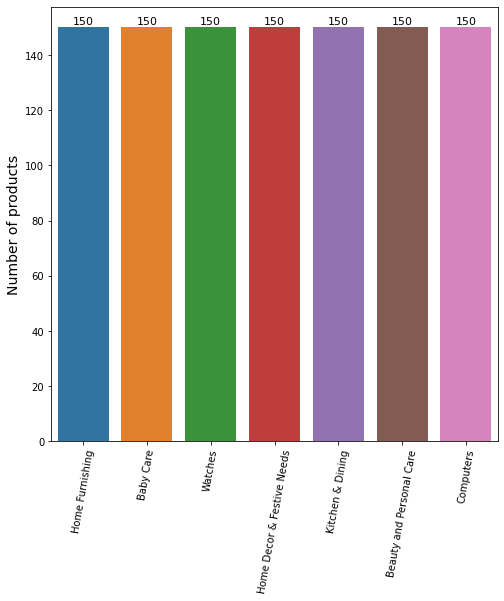

In [24]:
# Let's count the number of values under the category 1 'cat_level_0'
plt.figure(figsize=(8, 8))
    
plt.xticks(rotation=80)

first_cat_values = pd.DataFrame(data_category_levels["cat_level_0"].value_counts())


sns.barplot(x=first_cat_values.index, y=first_cat_values["cat_level_0"])

plt.ylabel("Number of products", size=14)

for i, v in enumerate(first_cat_values["cat_level_0"].values):
    plt.text(i, v+1, v, color='black', ha='center', size=11)

As we see our data is balanced (we have the same number of articles under every category)

Visualizing the distribution of categories

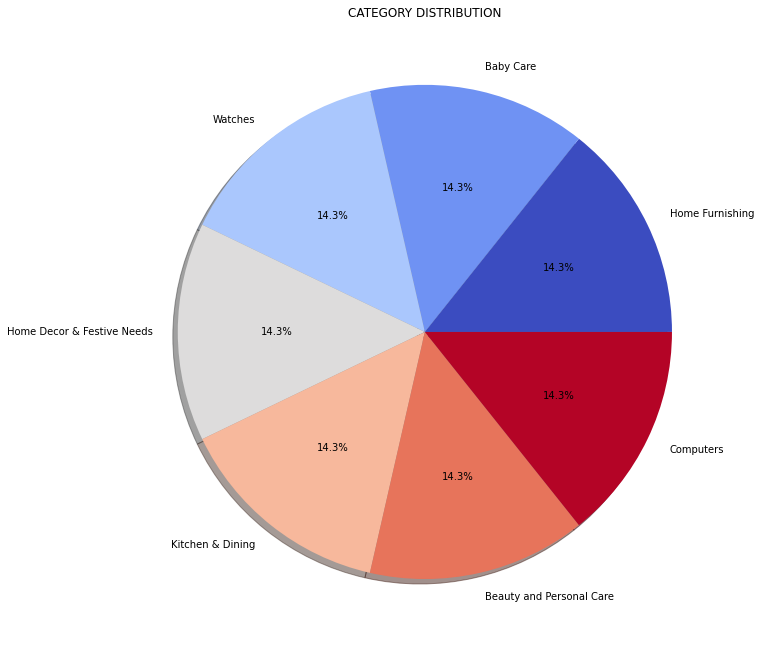

In [27]:
from matplotlib.gridspec import GridSpec
targetCounts = data_category_levels['cat_level_0'].value_counts()
targetLabels  = data_category_levels['cat_level_0'].unique()
# Make square figures and axes
plt.figure(1, figsize=(25,25))
the_grid = GridSpec(2, 2)


cmap = plt.get_cmap('coolwarm')
colors = [cmap(i) for i in np.linspace(0, 1, 7)]
plt.subplot(the_grid[0, 1], aspect=1, title='CATEGORY DISTRIBUTION')

source_pie = plt.pie(targetCounts, labels=targetLabels, autopct='%1.1f%%', shadow=True, colors=colors)
plt.show()

In [26]:
data_category_levels.columns

Index(['cat_level_0', 'cat_level_1', 'cat_level_2', 'cat_level_3',
       'cat_level_4', 'cat_level_5'],
      dtype='object')

 ## 2) Visualizing the sub-categories

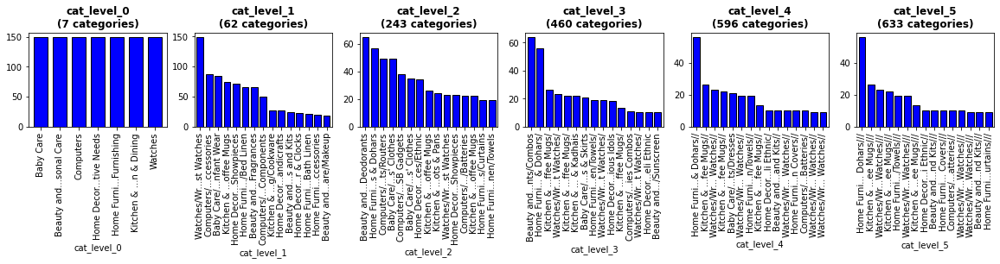

In [28]:
# Visualizing the 7 categories and their respective subcategories
fig = plt.figure(figsize=(20,2))

for counter, col in enumerate(data_category_levels.columns,1):
    # plot the graphs
    ax = fig.add_subplot(1,len(data_category_levels.columns), counter)
    ser = data_category_levels.groupby(col).size().sort_values(ascending=False)
    ser[0:15].plot.bar(width =0.75, color='blue', ec='k', ax=ax)
    # shorten the labels
    thr = int(10)
    label_x = [item.get_text() for item in ax.get_xticklabels()]
    short_lab_x = [s[:10]+'...'+s[-10:] if len(s)>10 else s for s in label_x]
    ax.axes.set_xticklabels(short_lab_x)
     # set title
    ax.set_title(col+f'\n({ser.shape[0]} categories)', fontweight='bold')

In [29]:
# finding unique values present in every category.
df = data_category_levels.columns
cat1 = data_category_levels['cat_level_0'].nunique()
cat2 = data_category_levels['cat_level_1'].nunique()
cat3 = data_category_levels['cat_level_2'].nunique()
cat4 = data_category_levels['cat_level_3'].nunique()
cat5 = data_category_levels['cat_level_4'].nunique()
cat6 = data_category_levels['cat_level_5'].nunique()
 
# printing the number of unique values present in each group
print(f'Number of unique values present in cat1: {cat1}')
print(f'Number of unique values present in cat2: {cat2}')
print(f'Number of unique values present in cat3: {cat3}')
print(f'Number of unique values present in cat4: {cat4}')
print(f'Number of unique values present in cat5: {cat5}')
print(f'Number of unique values present in cat6: {cat6}')



Number of unique values present in cat1: 7
Number of unique values present in cat2: 62
Number of unique values present in cat3: 243
Number of unique values present in cat4: 460
Number of unique values present in cat5: 596
Number of unique values present in cat6: 633


In [30]:
data_category_levels['cat_level_0'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

## 3) Number of unique subcategories with respect to their level

In [31]:
# Print for every category in level 0 the number of unique subcategories with respect to their level

print(data_category_levels[(data_category_levels['cat_level_0']== 'Home Furnishing')].nunique())
print(data_category_levels[(data_category_levels['cat_level_0']== 'Baby Care')].nunique())
print(data_category_levels[(data_category_levels['cat_level_0']== 'Watches')].nunique())
print(data_category_levels[(data_category_levels['cat_level_0']== 'Home Decor & Festive Needs')].nunique())
print(data_category_levels[(data_category_levels['cat_level_0']== 'Kitchen & Dining')].nunique())
print(data_category_levels[(data_category_levels['cat_level_0']== 'Beauty and Personal Care')].nunique())
print(data_category_levels[(data_category_levels['cat_level_0']== 'Computers')].nunique())


Unnamed: 0     150
cat_level_0      1
cat_level_1     11
cat_level_2     22
cat_level_3     52
cat_level_4     52
cat_level_5     52
dtype: int64
Unnamed: 0     150
cat_level_0      1
cat_level_1      9
cat_level_2     25
cat_level_3     74
cat_level_4     99
cat_level_5    133
dtype: int64
Unnamed: 0     150
cat_level_0      1
cat_level_1      2
cat_level_2     67
cat_level_3     69
cat_level_4     69
cat_level_5     69
dtype: int64
Unnamed: 0     150
cat_level_0      1
cat_level_1     10
cat_level_2     50
cat_level_3     92
cat_level_4    116
cat_level_5    117
dtype: int64
Unnamed: 0     150
cat_level_0      1
cat_level_1     11
cat_level_2     31
cat_level_3     52
cat_level_4     81
cat_level_5     81
dtype: int64
Unnamed: 0     150
cat_level_0      1
cat_level_1     11
cat_level_2     28
cat_level_3     48
cat_level_4     90
cat_level_5     92
dtype: int64
Unnamed: 0     150
cat_level_0      1
cat_level_1      8
cat_level_2     20
cat_level_3     73
cat_level_4     89
cat_level_

In [32]:

# nltk.download('stopwords')
# nltk.download('wordnet')
# nltk.download('punkt')


# II) Text preprocessing and cleaning

In [4]:
# Putting together the entire text data from the column 'description'
corpus = data['description'].str.cat(sep=' ').lower()

## 1) Remove tags, special characters and digits, stopwords, lemmatize

In [16]:
# Preprocessing steps of a text

stop_words = set(stopwords.words('english')) # What are stop words examples?
                                            # Stop words are a set of commonly used words in a language.
                                            # Examples of stop words in English are “a”, “the”, “is”, “are” and etc. 

def pre_process(text):
    
    # lowercase
    text=text.lower()
    
    #remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    #Convert to list from string
    text = text.split()
    
    # remove stopwords
    text = [word for word in text if word not in stop_words]

    # remove words less than three letters
    text = [word for word in text if len(word) >= 3]

    # lemmatize (reduce words with same radical to shorter versions)
    lmtzr = WordNetLemmatizer()
    text = [lmtzr.lemmatize(word) for word in text]
    
    return ' '.join(text)
  

### 2) WordCloud Visualization of the most frequently repeated words in the entire text of descriptions

In [17]:
# Preprocessed text contained in 'description' column of the datframe 'data'
the_whole_text = pre_process(corpus)

In [18]:
# Add a column to the datframe data with preprocessed description text
data['preprocessed_descriptions']  = data['description'].apply(lambda x:pre_process(x)) # apply 
data['preprocessed_descriptions'][0]

'key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interior curtain made high quality polyester fabric feature eyelet style stitch metal ring make room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight specification elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model duster color multicolor dimension length box number content sale package 

In [19]:
# Save new text dataframe with preprocessed text column 'preprocessed_descriptions' into a csv file
data.to_csv("data.csv")

In [20]:
data.columns

Index(['uniq_id', 'product_name', 'product_category_tree', 'image',
       'description', 'preprocessed_descriptions'],
      dtype='object')

In [4]:
data.head(1)

,Unnamed: 0,uniq_id,product_name,product_category_tree,image,description,preprocessed_descriptions
0,0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,key feature elegance polyester multicolor abst...


In [72]:
#data['preprocessed_descriptions'][:]

In [70]:
#data.head(1)

In [78]:
#data['cat_labels']

In [22]:
# Preprocessed descriptions , prepared to count the most frequent words and the number of their repetition 
Sentences = data['description'].values
cleanedSentences = ""
totalWords =[]
for i in range(0,len(data)):
    cleanedText = pre_process(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        totalWords.append(word)


# Print the most frequent words   
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(20)
print(mostcommon)

[('product', 864), ('free', 618), ('buy', 581), ('delivery', 567), ('genuine', 564), ('shipping', 564), ('cash', 564), ('price', 561), ('replacement', 559), ('day', 553), ('flipkart', 481), ('com', 473), ('guarantee', 471), ('mug', 457), ('feature', 404), ('online', 396), ('specification', 379), ('color', 369), ('watch', 355), ('type', 325)]


(-0.5, 799.5, 499.5, -0.5)

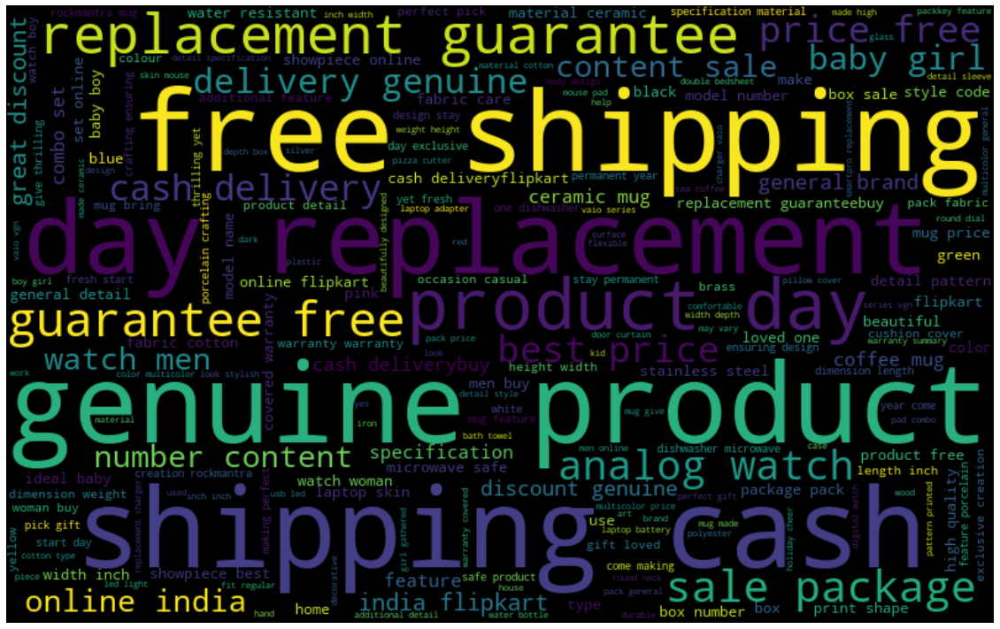

In [23]:
# Word cloud for entire dataset
wordcloud = WordCloud(width=800, height=500,
                      random_state=21, max_font_size=110).generate(cleanedSentences)
plt.figure(figsize=(20, 16))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')

### 3) Adding 'category_encode' column to the data 

In [5]:

# Adding a category column to the data (True categories of the prooducts)
data['category'] = data_category_levels['cat_level_0']

# Encode the categories g
le = preprocessing.LabelEncoder()
data['encoded_category'] = le.fit_transform(data['category'])


In [8]:
data['category'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

## III) Text feature extraction

## 1) ***Bag of words***

We need to convert the words into a numerical format (vectors) before feeding it to our model. 
The first step is to calculate the frequency of every word in the text, then we represent these frequencies in terms of vectors.
Every word is a feature, and the vector is the count of each word (column) in every sentence (row).
One major desadvantage of Bag of Words is the abscence of semantic meaning of the words.

In [10]:
# Creat Bag of Words 
from sklearn.feature_extraction.text import CountVectorizer
cvect = CountVectorizer()
cv_fit = cvect.fit(data['preprocessed_descriptions'])
cv_transform = cvect.transform(data['preprocessed_descriptions'][:]).toarray()

In [11]:
cv_transform.shape

(1050, 4515)

In [12]:
# As we sse every word is now having it's own column (feature) 
df_bag_of_words = pd.DataFrame(cv_transform, columns=cvect.get_feature_names())
df_bag_of_words.head()

,_blk,_red,_white_tblue_navy_purple,aaa,aapno,aari,aarika,ability,abkl_grn_grn_grn,abkl_pl_pl_pnk,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
# Saving the bert features 
from tempfile import TemporaryFile
outfile1= TemporaryFile()
np.save(outfile1, df_bag_of_words)

In [14]:

# Load the saved features
_ = outfile1.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [12]:
df_bag_of_words.shape

(1050, 4515)

## 2) ***TF-IDF***

TF-IDF stands for Text Frequency Inverse Document Frequency and it calculates Each and avery word importance in the text.

TF is the part where we first count the number of times the word is repeated in the sentence, then this count is divided by the total number of words in the same sentence.

IDF is the step where we calculate the log(number of sentences/ number of sentences containing the words).

TF is multiplyed by IDF and we get a weighted representation (a number between 0 and 1) of each word in the text. 

In [15]:
# Tf-Idf vectorization on preprocessed_descriptionst
from sklearn.feature_extraction.text import TfidfVectorizer
cv = TfidfVectorizer()
preporcessed_desc_tfidf = cv.fit_transform(data['preprocessed_descriptions'][:]).toarray()

In [16]:
preporcessed_desc_tfidf.shape

(1050, 4515)

In [17]:
# As we sse every word is now having it's own column (feature) 
df_prepr_desc_tfidf = pd.DataFrame(preporcessed_desc_tfidf, columns=cv.get_feature_names())
df_prepr_desc_tfidf.head()

,_blk,_red,_white_tblue_navy_purple,aaa,aapno,aari,aarika,ability,abkl_grn_grn_grn,abkl_pl_pl_pnk,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [127]:
# Saving the bert features 
from tempfile import TemporaryFile
outfile2= TemporaryFile()
np.save(outfile2, df_prepr_desc_tfidf)

In [129]:
# Load the saved features
_ = outfile2.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile2)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

## 3.  Word2Vec 

### 3.1 Creation of Word2Vec model

In [18]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100

# find the maximum length of sentences in descriptions
maxlen = data.preprocessed_descriptions.map(lambda x: len(x)).max()
maxlen = maxlen # adapt to length of sentences
sentences = data['preprocessed_descriptions'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [19]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                               workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4505
Word2Vec trained


### 3.2 Preparing the sentences - Tokenization 

In [20]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4506


### 3.3 Creation of the embeddings matrix

In [21]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4506, 300)


### 3.4 Creation of the embedding model

In [22]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 2524)]            0         
                                                                 
 embedding (Embedding)       (None, 2524, 300)         1351800   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,351,800
Trainable params: 1,351,800
Non-trainable params: 0
_________________________________________________________________


### 3.5 Running the model

In [23]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 1s 39ms/step


(1050, 300)

In [24]:
# Saving the bert features 
from tempfile import TemporaryFile
outfile3 = TemporaryFile()
np.save(outfile3, embeddings)

In [25]:
# Load the saved features
_ = outfile3.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile3)

array([[ 0.01275268, -0.01618459, -0.01129914, ...,  0.00632438,
         0.00741987, -0.02429481],
       [-0.00275715, -0.0062747 ,  0.00403937, ...,  0.00352474,
        -0.00040153, -0.01097643],
       [-0.01391934, -0.00585599, -0.00035317, ...,  0.00466413,
        -0.00661701, -0.01594319],
       ...,
       [-0.0075916 , -0.00162955,  0.00591279, ...,  0.0037629 ,
        -0.00614   ,  0.00475293],
       [-0.00720201, -0.00132983,  0.00592784, ...,  0.0058604 ,
        -0.00544975,  0.00193487],
       [-0.00708925, -0.00079427,  0.00613376, ...,  0.00405245,
        -0.00608518,  0.00360449]], dtype=float32)

## 4. BERT
#### Bidirectional Encoder Representations from Transformers
#### BERT takes into account the context for each occurrence of a given word. For instance, whereas the vector for "running" will have the same word2vec vector representation for both of its occurrences in the sentences "He is running a company" and "He is running a marathon", BERT will provide a contextualized embedding that will be different according to the sentence

In [23]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.9.1
2.9.1
Num GPUs Available:  0
True


#### Functions for sentence preparation and bert features calculations

In [38]:
# # Fonction de préparation des sentences
# def bert_inp_fct(sentences, bert_tokenizer, max_length) :
#     input_ids=[]
#     token_type_ids = []
#     attention_mask=[]
#     bert_inp_tot = []

#     for sent in sentences:
#         bert_inp = bert_tokenizer.encode_plus(sent,
#                                               add_special_tokens = True,
#                                               max_length = max_length,
#                                               padding='max_length',
#                                               return_attention_mask = True, 
#                                               return_token_type_ids=True,
#                                               truncation=True,
#                                               return_tensors="tf")
    
#         input_ids.append(bert_inp['input_ids'][0])
#         token_type_ids.append(bert_inp['token_type_ids'][0])
#         attention_mask.append(bert_inp['attention_mask'][0])
#         bert_inp_tot.append((bert_inp['input_ids'][0], 
#                              bert_inp['token_type_ids'][0], 
#                              bert_inp['attention_mask'][0]))

#     input_ids = np.asarray(input_ids)
#     token_type_ids = np.asarray(token_type_ids)
#     attention_mask = np.array(attention_mask)
    
#     return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# # Fonction de création des features
# def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
#     batch_size = b_size
#     batch_size_pred = b_size
#     bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
#     time1 = time.time()

#     for step in range(len(sentences)//batch_size) :
#         idx = step*batch_size
#         input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
#                                                                       bert_tokenizer, max_length)
        
#         if mode=='HF' :    # Bert HuggingFace
#             outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
#             last_hidden_states = outputs.last_hidden_state

#         if mode=='TFhub' : # Bert Tensorflow Hub
#             text_preprocessed = {"input_word_ids" : input_ids, 
#                                  "input_mask" : attention_mask, 
#                                  "input_type_ids" : token_type_ids}
#             outputs = model(text_preprocessed)
#             last_hidden_states = outputs['sequence_output']
             
#         if step ==0 :
#             last_hidden_states_tot = last_hidden_states
#             last_hidden_states_tot_0 = last_hidden_states
#         else :
#             last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
#     features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
#     time2 = np.round(time.time() - time1,0)
#     print("temps traitement : ", time2)
     
#     return features_bert, last_hidden_states_tot

In [25]:
# import tensorflow_hub as hub
# import tensorflow_text 

# # Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
# model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
# bert_layer = hub.KerasLayer(model_url, trainable=True)

In [26]:
# from transformers import TFBertModel
# tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model_type = "bert-base-uncased"
model = TFBertModel.from_pretrained(model_type)

loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at C:\Users\adele/.cache\huggingface\transformers\3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005bcd270f3c34464dc1704b715b5d7d52b1a461abe3b9e4e
Model config BertConfig {
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.19.4",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file https://huggingface.co/bert-base-uncased/resolve/main/tf_model.h5 from cac

In [27]:
sentences = data['preprocessed_descriptions'].to_list()
max_length = data.preprocessed_descriptions.map(lambda x: len(x)).max()
batch_size = 10

In [28]:
# Preparing the tokens for feature extraction step
def bert_inp_fct(sentences, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    
    for sent in sentences:
        
        bert_inp = tokenizer(sentences, return_tensors='tf', padding=True, max_length=max_length )

    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))
    
    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    


In [29]:
# Runnning the function 
input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences,  max_length)

loading file https://huggingface.co/bert-base-uncased/resolve/main/vocab.txt from cache at C:\Users\adele/.cache\huggingface\transformers\45c3f7a79a80e1cf0a489e5c62b43f173c15db47864303a55d623bb3c96f72a5.d789d64ebfe299b0e416afc4a169632f903f693095b4629a7ea271d5a0cf2c99
loading file https://huggingface.co/bert-base-uncased/resolve/main/added_tokens.json from cache at None
loading file https://huggingface.co/bert-base-uncased/resolve/main/special_tokens_map.json from cache at None
loading file https://huggingface.co/bert-base-uncased/resolve/main/tokenizer_config.json from cache at C:\Users\adele/.cache\huggingface\transformers\c1d7f0a763fb63861cc08553866f1fc3e5a6f4f07621be277452d26d71303b7e.20430bd8e10ef77a7d2977accefe796051e01bc2fc4aa146bc862997a1a15e79
loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at C:\Users\adele/.cache\huggingface\transformers\3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005b

In [67]:
input_ids

array([[ 101, 3145, 3444, ...,    0,    0,    0],
       [ 101, 3145, 3444, ...,    0,    0,    0],
       [ 101, 3145, 3444, ...,    0,    0,    0],
       ...,
       [ 101, 3145, 3444, ...,    0,    0,    0],
       [ 101, 3145, 3444, ...,    0,    0,    0],
       [ 101, 3145, 3444, ...,    0,    0,    0]])

In [53]:
token_type_ids


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [68]:
attention_mask

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]])

In [69]:
bert_inp_tot

[(<tf.Tensor: shape=(401,), dtype=int32, numpy=
  array([  101,  3145,  3444, 27745, 26572, 20367,  4800, 18717, 10061,
          3239,  7485,  2341, 11002, 18686, 11002, 27745, 26572, 20367,
          4800, 18717, 10061,  3239,  7485,  2341, 11002,  4578,  5308,
          3976, 11002, 11598,  2015,  2298,  4592, 11002,  2081,  2152,
          3737, 26572, 20367,  8313,  3444,  3239,  7485,  2806, 26035,
          3384,  3614,  2191,  2282,  4044,  6298,  8295, 11002, 14405,
         23277, 19839,  2571,  3424, 22802,  4270, 11552, 10439, 20486,
          3401,  2507,  2188,  4408, 19770,  2594,  5574,  2640, 16524,
          3086,  2469,  8954,  2540,  3824,  3239,  7485, 11748,  6651,
         11002,  7358, 15299,  4009,  4237,  2034,  2518,  2851,  6160,
          4408,  3103,  4097,  2215,  4299,  2204,  2851,  2878,  2088,
          4009,  2485,  3944,  3443,  2569,  2617,  6569,  3560,  5053,
          2445, 16684,  6140,  3288,  2188, 11552, 11002,  5238, 11307,
          2422, 

In [30]:
# Calculating the outputs of the model bert
outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=10)

105/105 [==============================] - 866s 8s/step


In [31]:
# Retreaving the last hidden states 
last_hidden_states= outputs.last_hidden_state

In [32]:
# Calculating the bert features
features_bert =np.array(last_hidden_states).mean(axis=1) 

In [33]:
# We have a numpy array 
features_bert.shape

(1050, 768)

In [34]:
# Saving the bert features 
from tempfile import TemporaryFile
outfile4 = TemporaryFile()
np.save(outfile4, features_bert)

In [35]:
# Load the saved features
_ = outfile4.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile4)

array([[-0.0153762 , -0.05073141,  0.61557084, ...,  0.03610056,
        -0.15770428, -0.14982067],
       [-0.0153762 , -0.05073141,  0.61557084, ...,  0.03610056,
        -0.15770428, -0.14982067],
       [-0.0153762 , -0.05073141,  0.61557084, ...,  0.03610056,
        -0.15770428, -0.14982067],
       ...,
       [-0.0153762 , -0.05073141,  0.61557084, ...,  0.03610056,
        -0.15770428, -0.14982067],
       [-0.0153762 , -0.05073141,  0.61557084, ...,  0.03610056,
        -0.15770428, -0.14982067],
       [-0.0153762 , -0.05073141,  0.61557084, ...,  0.03610056,
        -0.15770428, -0.14982067]], dtype=float32)

## 5. USE - Universal Sentence Encoder

In [36]:
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [37]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [40]:
import time
batch_size = 10
sentences = data['preprocessed_descriptions'].to_list()

# Shorten th elength of the sentences to 780 to have the same length as the y_train
# to avoid the ValueError: Found input variables with inconsistent numbers of samples: [787, 780]


In [41]:
features_USE = feature_USE_fct(sentences, batch_size)

In [42]:
len(features_USE)

1050

In [43]:
# Saving the bert features 
from tempfile import TemporaryFile
outfile5 = TemporaryFile()
np.save(outfile5, features_USE)

In [44]:
# Load the saved features
_ = outfile5.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile5)

array([[-5.2908231e-02, -5.3379763e-02,  8.2914438e-03, ...,
         4.5234744e-02,  3.7700273e-02, -2.1992922e-02],
       [-4.5701668e-02, -5.0107718e-02, -9.0658199e-03, ...,
         2.8772162e-02,  3.0556647e-02,  2.3403978e-02],
       [-5.3810075e-02, -5.0214104e-02, -2.5857288e-02, ...,
         5.0461404e-02, -2.0166904e-02, -4.4575073e-02],
       ...,
       [-9.0577705e-03, -5.1975753e-02, -2.4585444e-02, ...,
        -3.1532984e-02,  4.3753870e-02, -5.4698631e-02],
       [-1.4799931e-02, -5.1437128e-02,  4.0805954e-02, ...,
         1.3377525e-02, -2.1723403e-02,  8.0590537e-05],
       [-4.1494861e-02, -4.6286240e-02,  3.4106329e-02, ...,
         1.9290840e-02, -2.4415813e-02,  7.6575880e-03]], dtype=float32)

In [82]:
original_labels = data['encoded_category']

 ## IV) Calculating similarity between original categories and categories obtained after clsutering  

  ### Dimentionality reduction and KMeans clustering function

In [6]:

import time
from sklearn import cluster, metrics
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters

original_labels = data['encoded_category']

def ARI_fct(features) :
    
    """ This function will take as input the features that have been prepared by one the feature extraction methods.
    Then it will reduce the dimentions of the features, then it'll feed these reduces pca values to the clusterer.
    Then it 'll  do t_sne reduction for vizualization""" 
    
    time1 = time.time()
    num_labels=7 # 7 unique values corresponding to the initial known initial product categories
    # Dimentionality reduction with PCA
    pca = PCA(n_components= 0.99)
    pca_values = pca.fit_transform(features)
    
    # Do the clustering with KMeans
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    
    cls.fit(pca_values)
    cluster_labels_ = cls.labels_
    
    ARI = np.round(metrics.adjusted_rand_score(data['encoded_category'], cluster_labels_),4) # Round the results to 4 decimals
    
    # T_sne reduction for visualization of PCA values
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(pca_values)
    
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, pca_values, X_tsne, cluster_labels_
       
#----------------------------------------------------------------------------------------------------------------------------


TypeError: 'module' object is not subscriptable

### ARI similarity calculating and 2D vizualization of clusters

In [ ]:
original_labels = data['encoded_category']

def TSNE_visu_fct(X_tsne, original_labels, labels, ARI) :
    
    
    """ This function will plot the results of clustering 
    X_tsne = x_tsne reduced pca values
    original_labels = initial labels of the categories
    labels = labels after clustering
    ARI= Ari scores calculated with ARI_fct(features) function
    """
    
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c= original_labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(original_labels), loc="best", title="Categorie")
    plt.title('Representation of true catgories')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Representation of categories by clusters')
    
    plt.show()
    print("ARI : ", ARI)

## 1) Bag of Words

In [70]:
ARI_bow,pca_values_bow,  X_tsne_bow, cluster_labels_bow = ARI_fct(cv_transform)

ARI :  0.0726 time :  24.0


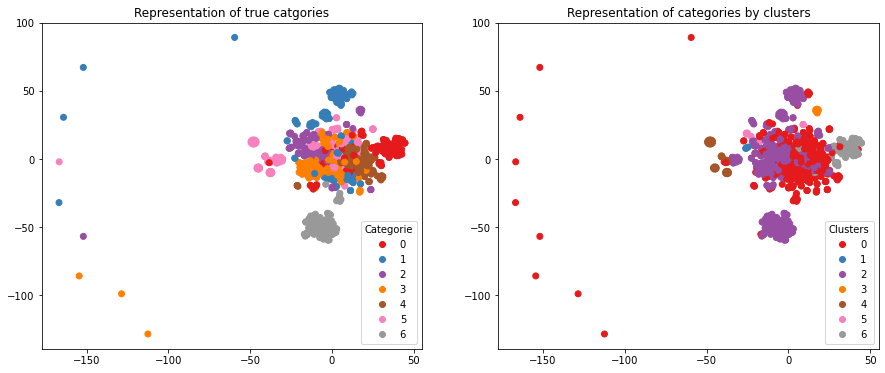

ARI :  0.0726


In [87]:
TSNE_visu_fct(X_tsne_bow, original_labels, cluster_labels_bow, ARI_bow)

## 2) TF-IDF

In [75]:
ARI_tf_idf, pca_values_tf_idf, X_tsne_tf_idf, cluster_labels_tf_idf = ARI_fct(preporcessed_desc_tfidf)

ARI :  0.2256 time :  22.0


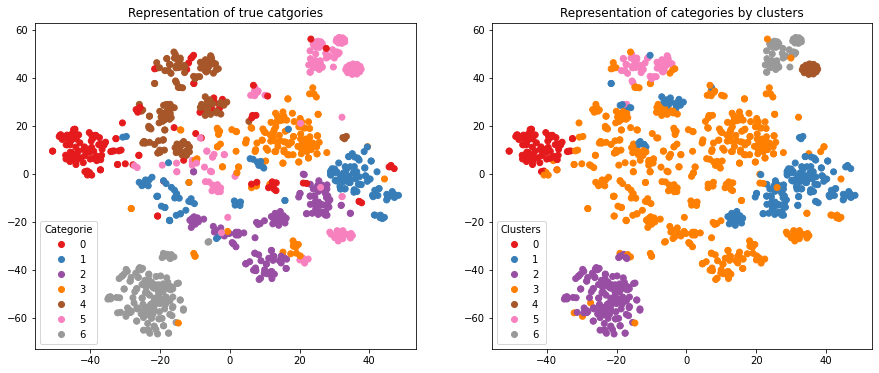

ARI :  0.2256


In [88]:
TSNE_visu_fct(X_tsne_tf_idf, original_labels, cluster_labels_tf_idf, ARI_tf_idf)

## 3) Word2Vec

In [79]:
ARI_Word2Vec, pca_values_Word2Vec, X_tsne_Word2Vec, cluster_labels_Word2Vec = ARI_fct(embeddings)

ARI :  0.0641 time :  16.0


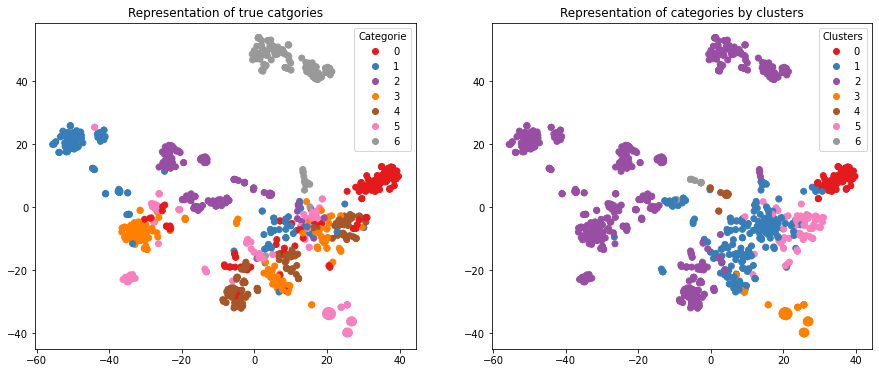

ARI :  0.0641


In [89]:
TSNE_visu_fct(X_tsne_Word2Vec, original_labels, cluster_labels_Word2Vec, ARI_Word2Vec)

## 4) Bert

In [80]:
ARI_Bert, pca_values_Bert, X_tsne_Bert, cluster_labels_Bert = ARI_fct(features_bert)

ARI :  -0.0001 time :  20.0


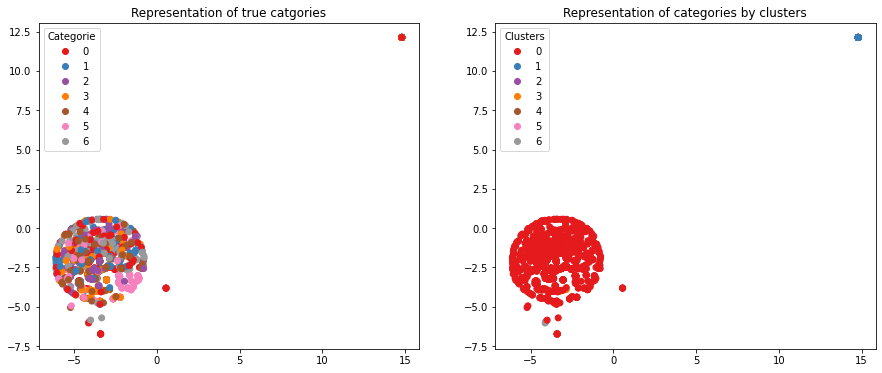

ARI :  -0.0001


In [90]:
TSNE_visu_fct(X_tsne_Bert, original_labels, cluster_labels_Bert, ARI_Bert)

## 5) USE (Universal Sentence Encoder)

In [81]:
ARI_USE, pca_values_USE, X_tsne_USE, cluster_labels_USE = ARI_fct(features_USE)

ARI :  0.3135 time :  22.0


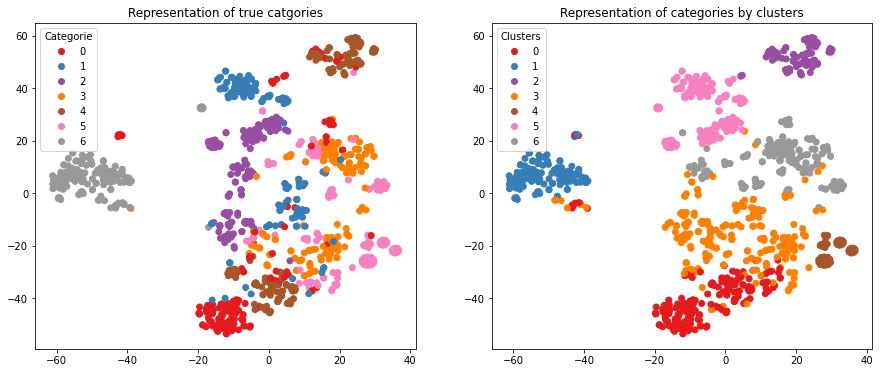

ARI :  0.3135


In [91]:
TSNE_visu_fct(X_tsne_USE, original_labels, cluster_labels_USE, ARI_USE)



**LDA Model Implementation**

Latent Dirichlet Allocation
“generative probabilistic model of a corpus.” = a statistical technique that can extract underlying themes/topics from a corpus.

In a traditional Bag-of-words approach for text feature extraction, we map each document directly to all the word tokens through a Document-Term matrix. This approach often results in a huge, sparse matrix with the majority of entries equal 0 — we have lots of parameters to estimate when we use such a matrix as model inputs, but many of them provide limited and sometimes “noisy” information.

In the LDA approach, instead of modeling the relationships between each text document and each word token directly, the “Latent variables” are introduced as “bridges.” Each document within the corpus is characterized by a Dirichlet distribution over the latent variables (topics) and each topic is characterized by another Dirichlet Distribution over all the word tokens.


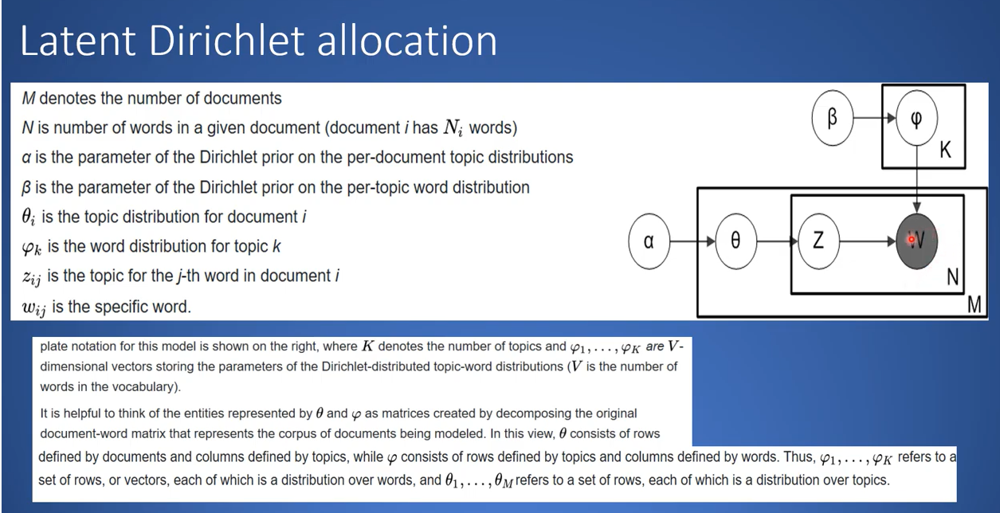

For each document, we can obtain a vector of length K which represents the probability distribution of the document over K topics. Appending such vectors for all the documents, we can get an N-by-K feature matrix that can be input into our supervised model with certain labels.


## V) Unsupervised Learning with LDA (Latent Dirichlet Allocation) Topic Modeling


 ## 1) Phrase Modeling: Bi-grams and Tri-grams
                Given a sequence of N-1 words, an N-gram model predicts the most probable word that might follow this sequence

In [95]:
# Preparing the data
texts = data["preprocessed_descriptions"]

## create list of lists of unigrams
lst_corpus = [] # list of comma separated words in each row (len(X_train))
for string in texts:
    lst_words = string.split()
    lst_grams = [" ".join(lst_words[i:i+1]) 
               for i in range(0, len(lst_words), 1)]
    lst_corpus.append(lst_grams)

## 2) Data Transformation: Corpus and Dictionary
                calculating Term Document Frequency

In [96]:
# See the frequency of every word in a document
# Create Dictionary of unique words in our corpus 
id2word = gensim.corpora.Dictionary(lst_corpus)
# Create Corpus
texts = lst_corpus
# Term Document Frequency = every row here is a document and a column is a word
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1])

[[(0, 4), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 11), (20, 2), (21, 1), (22, 1), (23, 5), (24, 2), (25, 1), (26, 4), (27, 2), (28, 1), (29, 1), (30, 1), (31, 6), (32, 1), (33, 2), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 2), (44, 1), (45, 2), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 2), (58, 1), (59, 1), (60, 2), (61, 4), (62, 1), (63, 1), (64, 3), (65, 2), (66, 6), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 2), (75, 2), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1)]]


In [97]:
len(corpus)

1050

## 3) Creating a Base Model and calculating it's Coherence score

In [99]:
# Creating a Base  Model
# The above LDA model is built with è different topics where each topic is a combination of keywords and each keyword contributes a certain weightage to the topic.

tf = cv.fit_transform(data['preprocessed_descriptions'][:]).toarray()

# Setting the number of topics equal to number of categories
n_topics = 7

# Instanciate LDA
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=n_topics,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                        alpha="auto")

lda = LatentDirichletAllocation(n_components=n_topics, max_iter=5, learning_method='online', learning_offset=50.,random_state=0)


In [100]:
# See the keywords for each topic and the weightage(importance) of each keyword
# Every topic is represented as a distribution over words
from pprint import pprint

# Print the Keyword in the è topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.028*"inch" + 0.025*"pack" + 0.023*"color" + 0.022*"type" + 0.021*"model" '
  '+ 0.021*"box" + 0.019*"feature" + 0.019*"package" + 0.019*"sale" + '
  '0.019*"number"'),
 (1,
  '0.030*"sticker" + 0.028*"wall" + 0.026*"mug" + 0.018*"brown" + '
  '0.017*"vinyl" + 0.017*"ceramic" + 0.017*"apply" + 0.012*"design" + '
  '0.012*"print" + 0.011*"decal"'),
 (2,
  '0.022*"usb" + 0.020*"light" + 0.018*"aroma" + 0.013*"price" + '
  '0.012*"kitchen" + 0.011*"use" + 0.010*"used" + 0.010*"bowl" + 0.009*"oil" + '
  '0.009*"home"'),
 (3,
  '0.034*"baby" + 0.025*"fabric" + 0.023*"cotton" + 0.022*"detail" + '
  '0.021*"girl" + 0.018*"boy" + 0.015*"specification" + 0.015*"shirt" + '
  '0.014*"general" + 0.014*"pack"'),
 (4,
  '0.070*"laptop" + 0.044*"warranty" + 0.027*"pad" + 0.027*"shape" + '
  '0.026*"mouse" + 0.018*"quality" + 0.015*"power" + 0.013*"size" + '
  '0.012*"adapter" + 0.012*"battery"'),
 (5,
  '0.057*"free" + 0.050*"product" + 0.047*"buy" + 0.047*"delivery" + '
  '0.047*"genuine" +

   ## Compute Model Perplexity and Coherence Score for the Base Model
    
   Perplexity =  how well does the model represent or reproduce the statistics of the held-out data.
                 A lower perplexity score indicates better generalization performance.
   
   Coherence score = Measures single topic by measuring the degree of semantic similarity between high scoring words in the topic.
                     These measurements help distinguish between topics that are semantically interpretable topics and topics that are artifacts of statistical inference. 

In [101]:
from gensim.models import CoherenceModel

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.5138513251446014


   ## 4) Hyper-parameter Tuning
    Finding the best hyperparameters for our LDA Model:
    
        - Number of Topics (K)
        - Dirichlet hyperparameter alpha: Document-Topic Density
        - Dirichlet hyperparameter beta: Word-Topic Densityalpha,
    
        
    Let's call the function, and iterate it over the range of topics, alpha, and beta parameter values

In [102]:
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [103]:
import numpy as np
import tqdm

grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 5
max_topics = 9
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['75% Corpus', '100% Corpus']

model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=(len(beta)*len(alpha)*len(topics_range)*len(corpus_title)))
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results)
    pbar.close()

100%|████████████████████████████████████████████████████████████████████████████████| 240/240 [57:09<00:00, 14.29s/it]


In [104]:
# Saving the results
df_results =pd.DataFrame(model_results)
df_results.to_csv("df_results.csv")

In [105]:
df_results = pd.read_csv("df_results.csv")

In [131]:
pd.set_option('display.max_rows', None)
df_results


,Unnamed: 0,Validation_Set,Topics,Alpha,Beta,Coherence
0,0,75% Corpus,5,0.01,0.01,0.604602
1,1,75% Corpus,5,0.01,0.31,0.592469
2,2,75% Corpus,5,0.01,0.61,0.588314
3,3,75% Corpus,5,0.01,0.9099999999999999,0.576397
4,4,75% Corpus,5,0.01,symmetric,0.608571
5,5,75% Corpus,5,0.31,0.01,0.520292
6,6,75% Corpus,5,0.31,0.31,0.588384
7,7,75% Corpus,5,0.31,0.61,0.611039
8,8,75% Corpus,5,0.31,0.9099999999999999,0.583054
9,9,75% Corpus,5,0.31,symmetric,0.511719


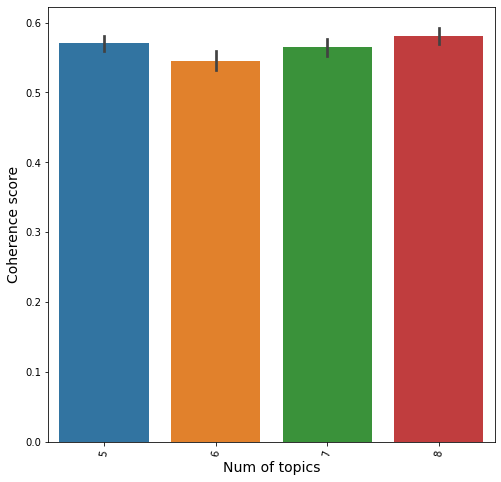

In [107]:
# Let's the coherence scores for topics from 5 to 8
plt.figure(figsize=(8, 8))
    
plt.xticks(rotation=80)

sns.barplot(x=df_results['Topics'], y=df_results['Coherence'])
plt.xlabel("Num of topics", size=14)
plt.ylabel("Coherence score", size=14)
#plt.legend("Coherence_values")
plt.show()

### We see that for number of topics 8 the coherence score is the most high

## 5) Final model

In [132]:
num_topics = 5 

lda_final_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha='asymmetric',
                                           eta=0.9099999999999999)

In [133]:
# Compute Perplexity ==> the lower the better
perplexity_score_final = lda_final_model.log_perplexity(corpus)  # a measure of how good the model is. lower the better 
print("The perplexity score is : {}".format(perplexity_score_final))
    
from gensim.models import CoherenceModel

# Compute Coherence Score
coherence_model_lda_final = CoherenceModel(model=lda_final_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda_final = coherence_model_lda_final.get_coherence()
print("The coherence  score is : {}".format(coherence_lda_final))

The perplexity score is : -6.74234408060299
The coherence  score is : 0.6087393388716181


In [78]:
!pip install pyLDAvis==2.1.2

In [134]:
lda_model.print_topics()

[(0,
  '0.028*"inch" + 0.025*"pack" + 0.023*"color" + 0.022*"type" + 0.021*"model" + 0.021*"box" + 0.019*"feature" + 0.019*"package" + 0.019*"sale" + 0.019*"number"'),
 (1,
  '0.030*"sticker" + 0.028*"wall" + 0.026*"mug" + 0.018*"brown" + 0.017*"vinyl" + 0.017*"ceramic" + 0.017*"apply" + 0.012*"design" + 0.012*"print" + 0.011*"decal"'),
 (2,
  '0.022*"usb" + 0.020*"light" + 0.018*"aroma" + 0.013*"price" + 0.012*"kitchen" + 0.011*"use" + 0.010*"used" + 0.010*"bowl" + 0.009*"oil" + 0.009*"home"'),
 (3,
  '0.034*"baby" + 0.025*"fabric" + 0.023*"cotton" + 0.022*"detail" + 0.021*"girl" + 0.018*"boy" + 0.015*"specification" + 0.015*"shirt" + 0.014*"general" + 0.014*"pack"'),
 (4,
  '0.070*"laptop" + 0.044*"warranty" + 0.027*"pad" + 0.027*"shape" + 0.026*"mouse" + 0.018*"quality" + 0.015*"power" + 0.013*"size" + 0.012*"adapter" + 0.012*"battery"'),
 (5,
  '0.057*"free" + 0.050*"product" + 0.047*"buy" + 0.047*"delivery" + 0.047*"genuine" + 0.047*"shipping" + 0.047*"cash" + 0.041*"replacement" 

In [116]:
!pip install --upgrade pandas==1.2

  Attempting uninstall: pandas
    Found existing installation: pandas 1.2.4
    Uninstalling pandas-1.2.4:
      Successfully uninstalled pandas-1.2.4


## 6) Visualize the results of  topics-keywords with pyLDAvis

In [135]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_final_model, corpus, id2word, mds="mmds", R=30)

vis

C:\Users\adele\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.129165 -0.069277       1        1  30.689989
1      0.074366 -0.236736       2        1  25.954611
3     -0.151157  0.060641       3        1  15.794887
2     -0.002111  0.135287       4        1  13.058768
5      0.028903 -0.005513       5        1   5.398009
6      0.063451  0.034986       6        1   4.972975
4      0.115713  0.080612       7        1   4.130761, topic_info=                Term        Freq       Total Category  logprob  loglift
225         shipping  441.000000  441.000000  Default  30.0000  30.0000
211             cash  441.000000  441.000000  Default  29.0000  29.0000
218          genuine  441.000000  441.000000  Default  28.0000  28.0000
214         delivery  443.000000  443.000000  Default  27.0000  27.0000
210              buy  448.000000  448.000000  Default  26.0000  26.0000
212              com  345.000000  345.000000  Default  25.0000  25.0000
220        guarantee  335.000000  335.000000  Default  24.0000  24.0000
217             free  490.000000  490.000000  Default  23.0000  23.0000
216         flipkart  349.000000  349.000000  Default  22.0000  22.0000
223           online  294.000000  294.000000  Default  21.0000  21.0000
224      replacement  383.000000  383.000000  Default  20.0000  20.0000
641             baby  201.000000  201.000000  Default  19.0000  19.0000
213              day  387.000000  387.000000  Default  18.0000  18.0000
679              mug  220.000000  220.000000  Default  17.0000  17.0000
227            watch  244.000000  244.000000  Default  16.0000  16.0000
150          product  635.000000  635.000000  Default  15.0000  15.0000
642           detail  150.000000  150.000000  Default  14.0000  14.0000
209           analog  179.000000  179.000000  Default  13.0000  13.0000
32            fabric  147.000000  147.000000  Default  12.0000  12.0000
104           cotton  229.000000  229.000000  Default  11.0000  11.0000
105             girl  138.000000  138.000000  Default  10.0000  10.0000
207         warranty  164.000000  164.000000  Default   9.0000   9.0000
2286         adapter   81.000000   81.000000  Default   8.0000   8.0000
64              pack  247.000000  247.000000  Default   7.0000   7.0000
2302          laptop  199.000000  199.000000  Default   6.0000   6.0000
153             skin  193.000000  193.000000  Default   5.0000   5.0000
445             best  192.000000  192.000000  Default   4.0000   4.0000
1015          sleeve   68.000000   68.000000  Default   3.0000   3.0000
667           coffee   79.000000   79.000000  Default   2.0000   2.0000
33           feature  260.000000  260.000000  Default   1.0000   1.0000
183            sheet   67.549322   71.280056   Topic1  -5.4919   1.1275
661             hair   46.634751   49.768420   Topic1  -5.8624   1.1162
1348           mouse   55.918978   60.054489   Topic1  -5.6809   1.1099
167         bedsheet   54.547789   58.642002   Topic1  -5.7057   1.1089
179           pillow   38.588888   41.672268   Topic1  -6.0518   1.1044
8             beauty   38.259710   41.390915   Topic1  -6.0604   1.1026
31            eyelet   40.383315   43.889917   Topic1  -6.0064   1.0980
3456         nutcase   35.395932   38.509440   Topic1  -6.1382   1.0969
3325            wrap   31.491319   34.641003   Topic1  -6.2551   1.0859
884         creation   31.124067   34.330242   Topic1  -6.2668   1.0832
1459      rockmantra   32.083959   35.425499   Topic1  -6.2364   1.0822
849           bottle   58.669031   65.117178   Topic1  -5.6329   1.0770
576        microwave   30.401704   33.805034   Topic1  -6.2903   1.0751
19           curtain   42.641164   47.677476   Topic1  -5.9520   1.0696
451         designer   26.773768   30.145977   Topic1  -6.4174   1.0626
1455       exclusive   30.411990   34.243755   Topic1  -6.2899   1.0626
23              door   31.584888   35.660678   Topic1  -6.2521   1.0599
125           b

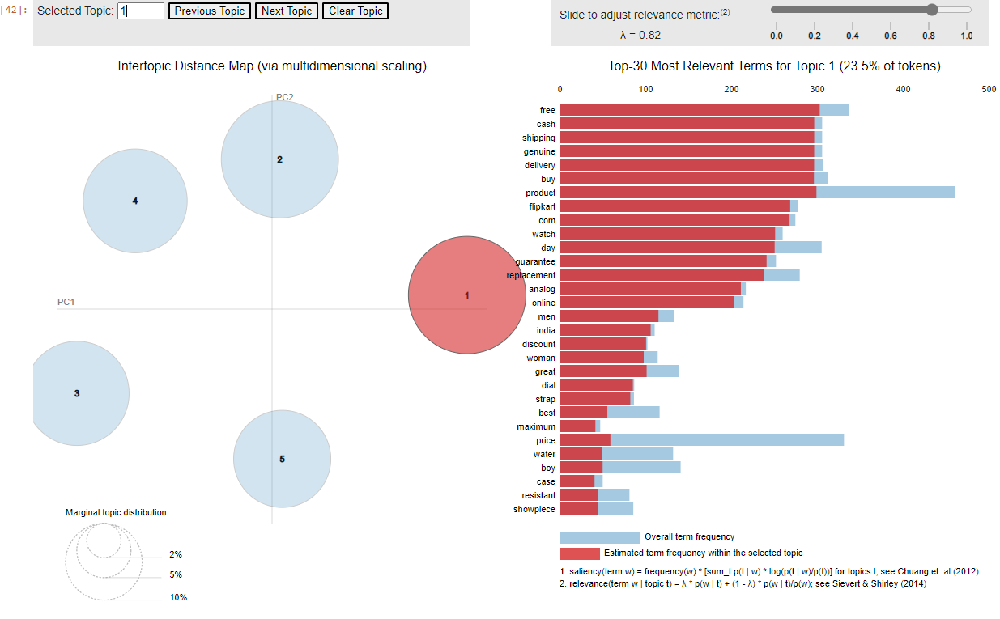

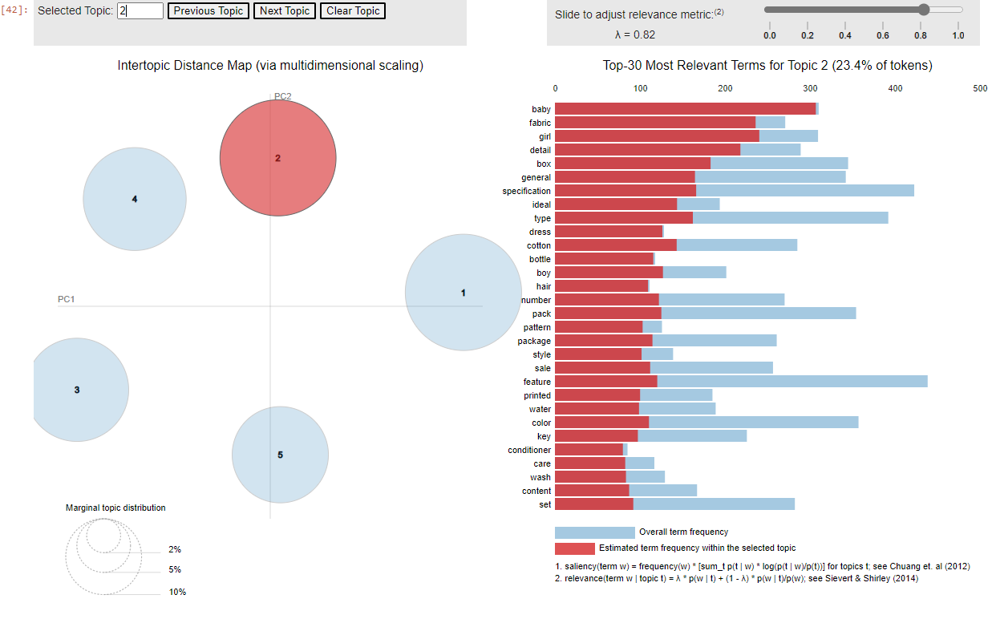

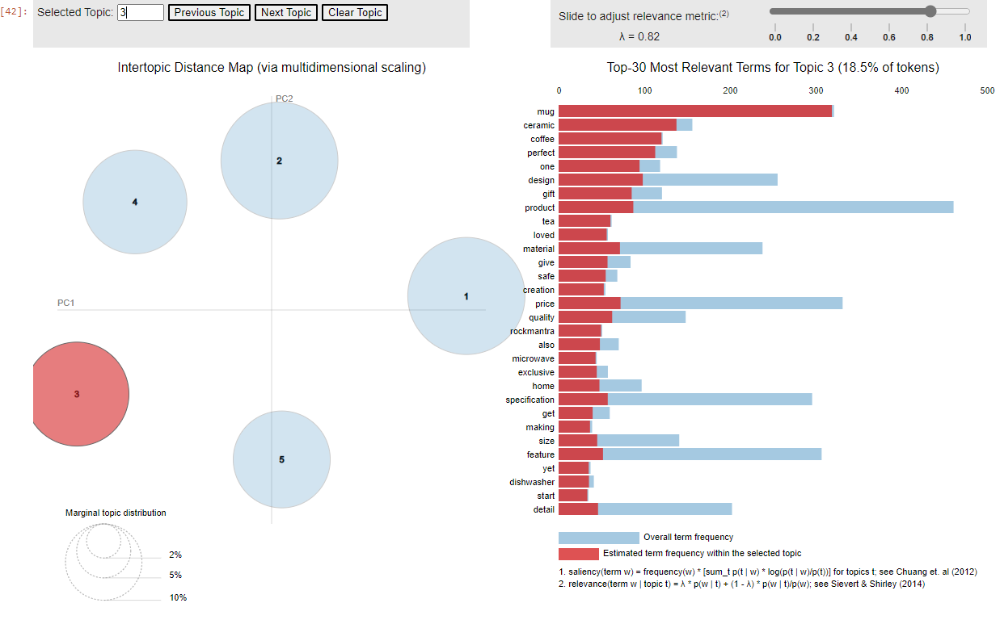

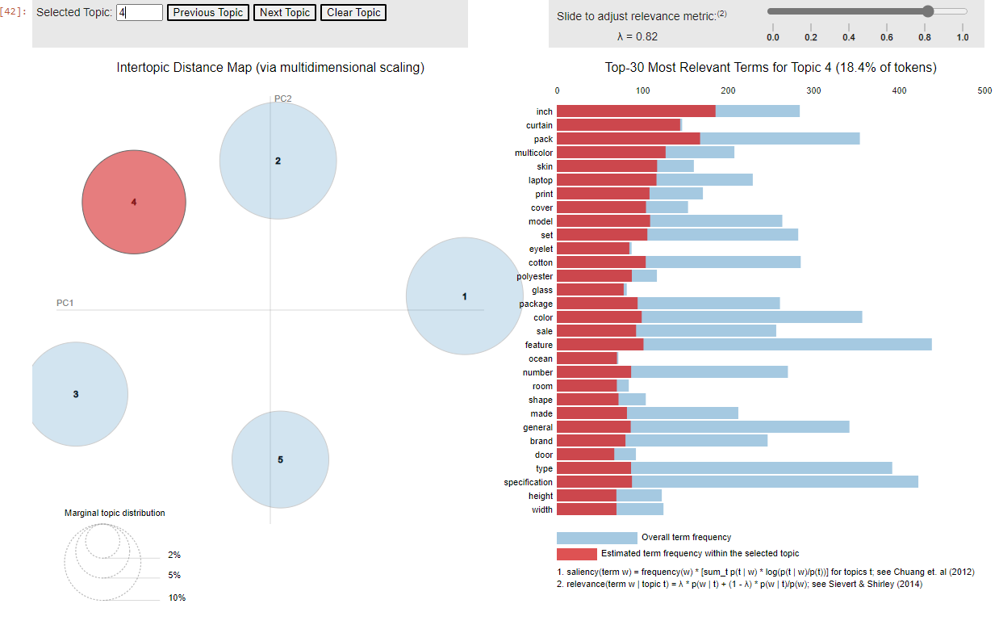

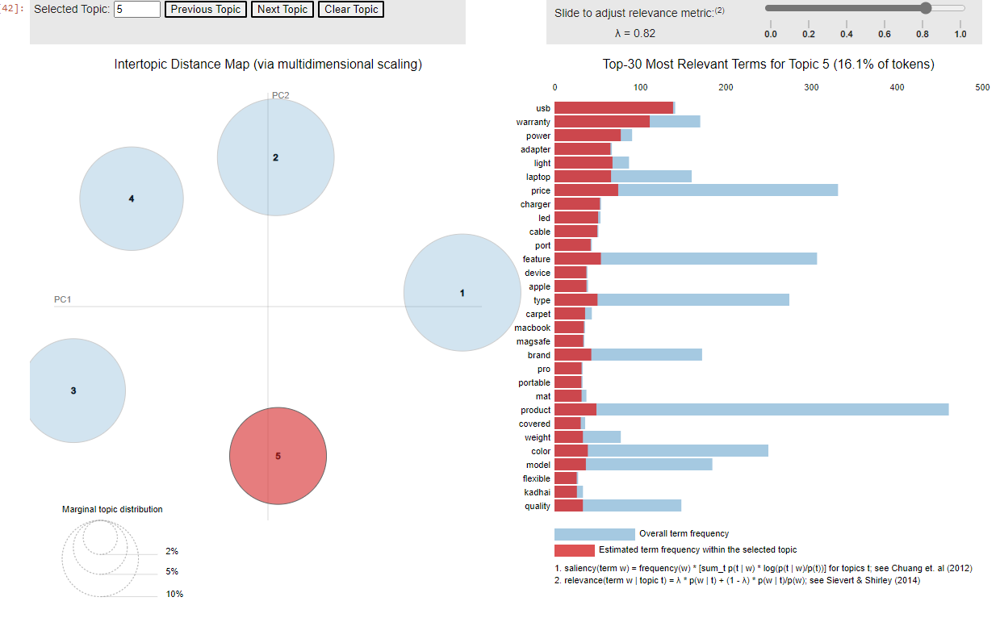

The area of circle represents the importance of each topic over the entire corpus, the distance between the center of circles indicate the similarity between topics. For each topic, the histogram on the right side lists the top 30 most relevant terms.

In Red bars is given the frequency of each word given a topic
We can also rerank words and introduce new words tnat are more specific to a topic of interest, we do that by decreasing the value of lambda
We are putting more weight to frequency given the topic to the overall frequency of the word
If we hover over a certain word we can also see where in which topics this word is also present, by doing this we show the unexplained (grey part) of the frequency, the topics will show up when we hover over the word of interest